In [1]:
import requests
import pandas as pd

In [ ]:
# API calls for bus routes stuff

api_key = ''
headers = {
    'AccountKey': api_key,
    'accept': 'application/json'
}

base_url = 'http://datamall2.mytransport.sg/ltaodataservice/BusRoutes'
skip = 0
all_data = []

while True:
    url = f"{base_url}?$skip={skip}"
    response = requests.get(url, headers=headers)

    if response.status_code == 200:
        data = response.json()['value']
        if not data: 
            break
        all_data.extend(data)
        skip += 500  
    else:
        print(f"Failed to fetch data: {response.status_code}")
        break

df = pd.DataFrame(all_data)
df.to_csv('Bus_Routes.csv', index=False)

In [31]:
bus_routes = pd.read_csv('Bus_Routes.csv')
bus_services = pd.read_csv('Bus_Services.csv')
bus_stops = pd.read_csv('Bus_Stops.csv')
passenger_vol_feb = pd.read_csv('transport_node_bus_202402.csv')

In [32]:
print(bus_routes.shape)
print(bus_services.shape)
print(bus_stops.shape)
print(passenger_vol_feb.shape)

(25144, 12)
(708, 11)
(5106, 5)
(198903, 7)


In [16]:
print(bus_routes.head())
print(bus_services.head())
print(bus_stops.head())
print(passenger_vol_feb.head())

  ServiceNo Operator  Direction  StopSequence  BusStopCode  Distance  \
0        10     SBST          1             1        75009       0.0   
1        10     SBST          1             2        76059       0.6   
2        10     SBST          1             3        76069       1.1   
3        10     SBST          1             4        96289       2.3   
4        10     SBST          1             5        96109       2.7   

   WD_FirstBus  WD_LastBus SAT_FirstBus SAT_LastBus SUN_FirstBus SUN_LastBus  
0          500        2300         0500        2300         0500        2300  
1          502        2302         0502        2302         0502        2302  
2          504        2304         0504        2304         0503        2304  
3          508        2308         0508        2309         0507        2308  
4          509        2310         0509        2311         0508        2309  
  ServiceNo Operator  Direction Category  OriginCode  DestinationCode  \
0       118      GAS

In [33]:
from geopy.distance import geodesic

# National Stadium coordinates
stadium_coords = (1.3040, 103.8748)

# calculate distance of each bus stop from the stadium
bus_stops['Distance_to_Stadium'] = bus_stops.apply(
    lambda row: geodesic((row['Latitude'], row['Longitude']), stadium_coords).meters, axis=1)

closest_bus_stops = bus_stops.sort_values(by='Distance_to_Stadium').head(10)
closest_bus_stops


,BusStopCode,RoadName,Description,Latitude,Longitude,Distance_to_Stadium
4471,80199,Stadium Cres,Stadium Stn,1.301558,103.875135,272.548193
4470,80191,Stadium Walk,Opp S'pore Indoor Stadium,1.301609,103.875406,272.861889
4473,80219,Nicoll Highway,Natl Stadium,1.306744,103.875264,307.762569
4472,80211,Nicoll Highway,Opp Natl Stadium,1.307128,103.875481,354.090271
4466,80171,Stadium Walk,CP F,1.300841,103.877154,436.622790
4467,80179,Stadium Cres,Opp CP F,1.300594,103.877129,457.167861
4468,80181,Stadium Blvd,Kallang Squash Ctr,1.305084,103.879698,558.180411
4458,80111,Sims Way,Bef Geylang Rd,1.309871,103.875515,654.085356
4460,80141,Mountbatten Rd,Opp S.A. Deaf,1.307118,103.879894,663.516574
4459,80119,Sims Way,Aft Geylang Rd,1.309921,103.875998,668.114829


In [34]:
# passenger volume data for the closest bus stops
closest_bus_stops_codes = closest_bus_stops['BusStopCode'].tolist()
filtered_passenger_volume = passenger_vol_feb[passenger_vol_feb['PT_CODE'].isin(closest_bus_stops_codes)]

# total tap-in and tap-out volumes to identify crowded stops
crowdedness = filtered_passenger_volume.groupby('PT_CODE').agg(
    Total_Tap_In=('TOTAL_TAP_IN_VOLUME', 'sum'),
    Total_Tap_Out=('TOTAL_TAP_OUT_VOLUME', 'sum')
).reset_index()

crowdedness = crowdedness.merge(bus_stops, left_on='PT_CODE', right_on='BusStopCode')

# stops sorted by total tap-in volume (proxy for crowdedness)
crowdedness_sorted = crowdedness.sort_values(by='Total_Tap_In', ascending=False)
crowdedness_sorted[['PT_CODE', 'RoadName', 'Description', 'Total_Tap_In', 'Total_Tap_Out']]


,PT_CODE,RoadName,Description,Total_Tap_In,Total_Tap_Out
7,80199,Stadium Cres,Stadium Stn,26033,28568
2,80141,Mountbatten Rd,Opp S.A. Deaf,22234,24730
1,80119,Sims Way,Aft Geylang Rd,17568,34159
0,80111,Sims Way,Bef Geylang Rd,6863,8246
8,80211,Nicoll Highway,Opp Natl Stadium,5050,8710
9,80219,Nicoll Highway,Natl Stadium,4777,4714
6,80191,Stadium Walk,Opp S'pore Indoor Stadium,1488,535
5,80181,Stadium Blvd,Kallang Squash Ctr,233,414
3,80171,Stadium Walk,CP F,123,98
4,80179,Stadium Cres,Opp CP F,118,198


In [90]:
# only keep those tap in > 10000 in crowdedness_sorted
crowdedness_sorted = crowdedness_sorted[crowdedness_sorted['Total_Tap_In'] > 10000]
crowdedness_sorted

,PT_CODE,Total_Tap_In,Total_Tap_Out,BusStopCode,RoadName,Description,Latitude,Longitude,Distance_to_Stadium
7,80199,26033,28568,80199,Stadium Cres,Stadium Stn,1.301558,103.875135,272.548193
2,80141,22234,24730,80141,Mountbatten Rd,Opp S.A. Deaf,1.307118,103.879894,663.516574
1,80119,17568,34159,80119,Sims Way,Aft Geylang Rd,1.309921,103.875998,668.114829


In [91]:
# buses serving the most crowded bus stops
crowded_bus_stops_codes = crowdedness_sorted['PT_CODE'].tolist()
filtered_bus_routes = bus_routes[bus_routes['BusStopCode'].isin(crowded_bus_stops_codes)]

filtered_bus_routes = filtered_bus_routes.merge(bus_services, on=['ServiceNo', 'Operator', 'Direction'])

filtered_bus_routes_details = filtered_bus_routes[['ServiceNo', 'Operator', 'Direction', 'BusStopCode', 'OriginCode', 'DestinationCode']].drop_duplicates()
filtered_bus_routes_details

,ServiceNo,Operator,Direction,BusStopCode,OriginCode,DestinationCode
0,10,SBST,1,80141,75009.0,16009.0
1,11,SBST,1,80119,80009.0,80009.0
2,11,SBST,1,80199,80009.0,80009.0
4,11,SBST,1,80141,80009.0,80009.0
5,12,GAS,1,80141,77009.0,10499.0
6,12,GAS,2,80119,10499.0,77009.0
7,14,SBST,1,80141,84009.0,17009.0
8,14A,SBST,1,80141,84009.0,9059.0
9,158,SBST,1,80119,66009.0,66009.0
10,158,SBST,1,80141,66009.0,66009.0


In [92]:
filtered_bus_routes_details['ServiceNo'].unique()

array(['10', '11', '12', '14', '14A', '158', '158A', '16', '16M', '196',
       '196A', '197', '31', '32', '33', '7'], dtype=object)

In [96]:
# bus services that serve the top crowded stops
unique_bus_services = filtered_bus_routes['ServiceNo'].unique()

route_analysis = bus_routes[bus_routes['ServiceNo'].isin(unique_bus_services)]
route_analysis = route_analysis.merge(bus_stops, left_on='BusStopCode', right_on='BusStopCode', how='left')
route_analysis = route_analysis.sort_values(by=['ServiceNo', 'Direction', 'StopSequence'])
route_analysis = route_analysis[['ServiceNo', 'Direction', 'StopSequence', 'BusStopCode', 'RoadName', 'Description', 'Latitude', 'Longitude']]
route_analysis

,ServiceNo,Direction,StopSequence,BusStopCode,RoadName,Description,Latitude,Longitude
0,10,1,1,75009,Tampines Ctrl 1,Tampines Int,1.354076,103.943391
1,10,1,2,76059,Tampines Ave 5,Opp Our Tampines Hub,1.352962,103.941652
2,10,1,3,76069,Tampines Ave 5,Blk 147,1.348753,103.942086
3,10,1,4,96289,Simei Ave,Changi General Hosp,1.340055,103.948381
4,10,1,5,96109,Simei Ave,Opp Blk 3012,1.337371,103.950673
...,...,...,...,...,...,...,...,...
1534,7,2,48,83062,Sims Ave East,Kembangan Stn,1.320969,103.913328
1535,7,2,49,83081,Sims Ave East,Opp Perpetual Succour Ch,1.321387,103.917366
1536,7,2,50,84011,New Upp Changi Rd,Chai Chee Ind Pk,1.322577,103.922334
1537,7,2,51,84021,New Upp Changi Rd,Blk 32,1.323383,103.925087


In [ ]:
unique_routes = route_analysis[['ServiceNo', 'Direction']].drop_duplicates()
unique_routes

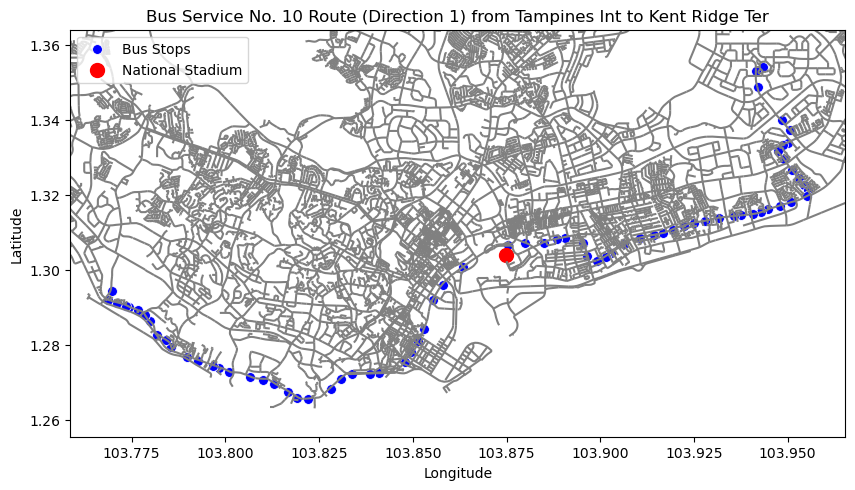

In [85]:
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

service_no = '10'
route_direction = 1

route_example = route_analysis[(route_analysis['ServiceNo'] == service_no) & (route_analysis['Direction'] == route_direction)]

singapore_map = gpd.read_file('RoadSectionLine.shp')

svy21_wkt = 'PROJCS["SVY21",GEOGCS["GCS_WGS_1984",DATUM["D_WGS_1984",SPHEROID["WGS_1984",6378137.0,298.257223563]],PRIMEM["Greenwich",0.0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["False_Easting",28001.642],PARAMETER["False_Northing",38744.572],PARAMETER["Central_Meridian",103.8333333333333],PARAMETER["Scale_Factor",1.0],PARAMETER["Latitude_Of_Origin",1.366666666666667],UNIT["Meter",1.0]]'
singapore_map.set_crs(svy21_wkt, inplace=True)
singapore_map = singapore_map.to_crs('epsg:4326')

# bounds for bus route
min_lon, max_lon = route_example['Longitude'].min(), route_example['Longitude'].max()
min_lat, max_lat = route_example['Latitude'].min(), route_example['Latitude'].max()
buffer = 0.01  
min_lon -= buffer
max_lon += buffer
min_lat -= buffer
max_lat += buffer

# base layer: SG map 
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
singapore_map.plot(ax=ax, color='gray')  
ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)

# bus route scatter plot
sns.scatterplot(x='Longitude', y='Latitude', data=route_example, color='blue', s=50, label='Bus Stops')

# Stadium coordinates
ax.scatter(stadium_coords[1], stadium_coords[0], color='red', s=100, label='National Stadium')


# to name the route
route_example.sort_values('StopSequence', inplace=True)
first_stop_name = route_example.iloc[0]['Description']
last_stop_name = route_example.iloc[-1]['Description']
plot_title = f"Bus Service No. {service_no} Route (Direction {route_direction}) from {first_stop_name} to {last_stop_name}"
plt.title(plot_title)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
ax.legend()
plt.show()


C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


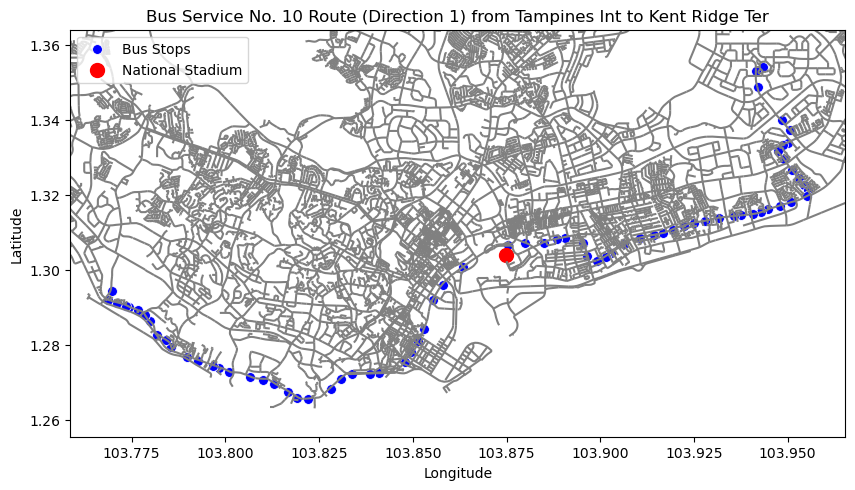

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


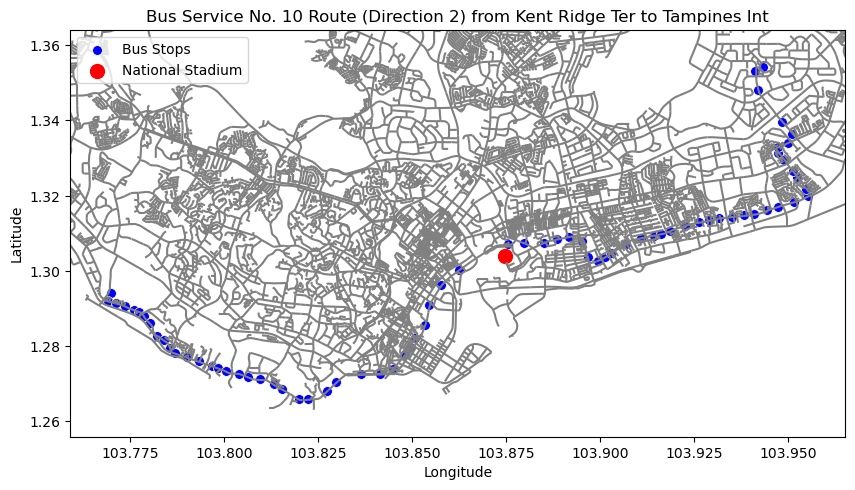

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


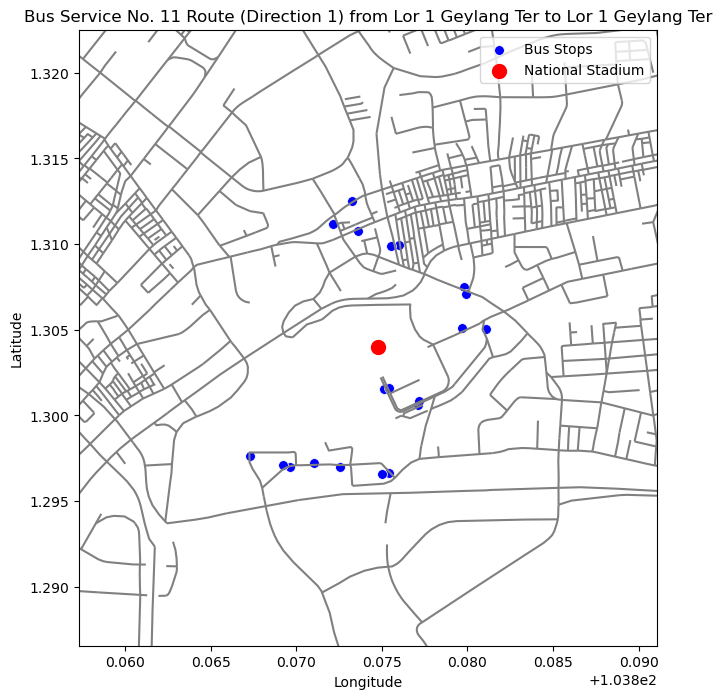

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


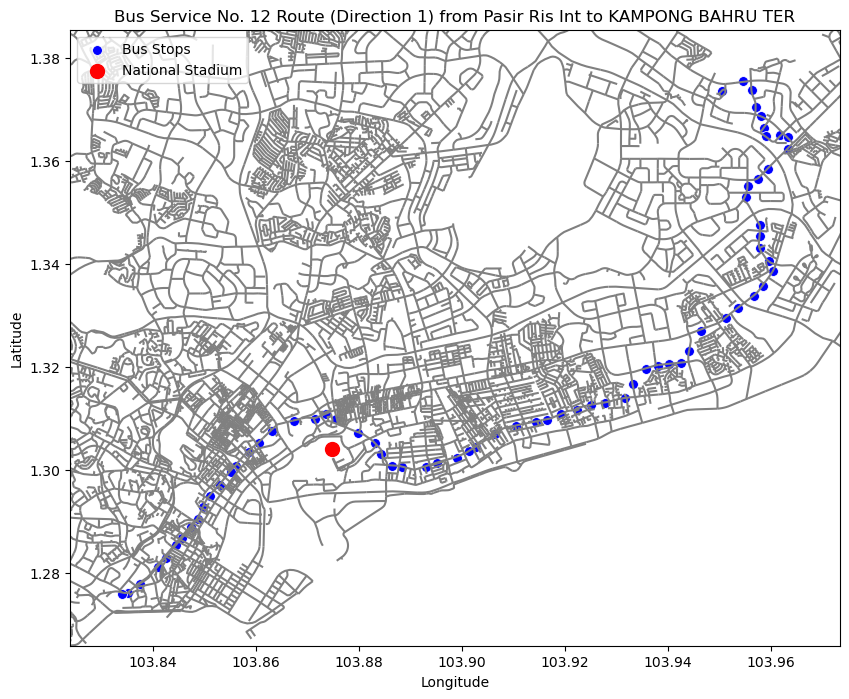

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


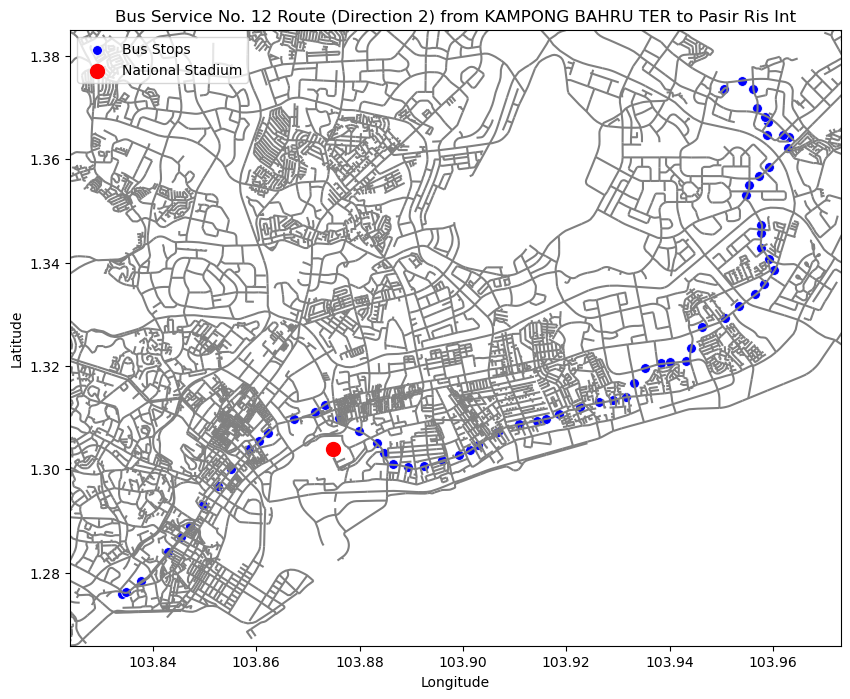

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


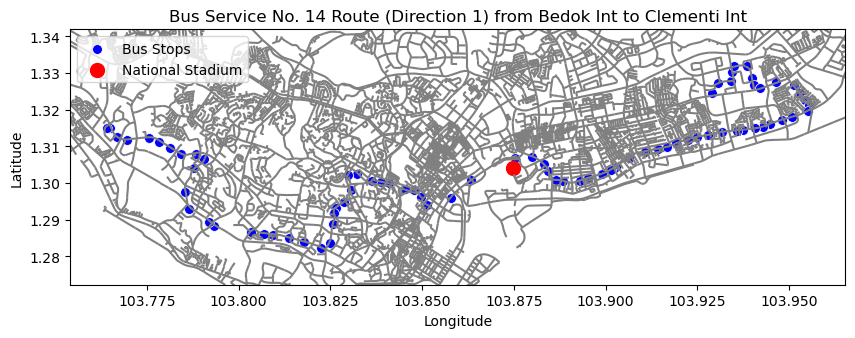

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


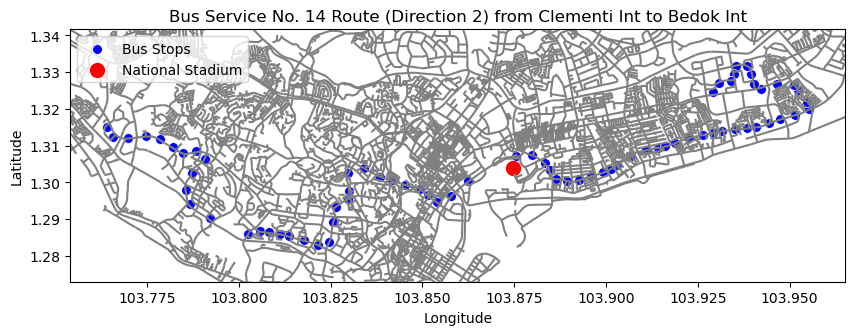

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


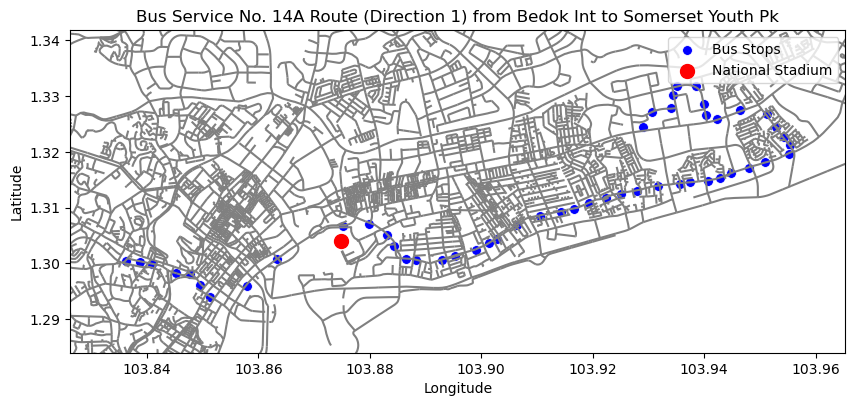

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


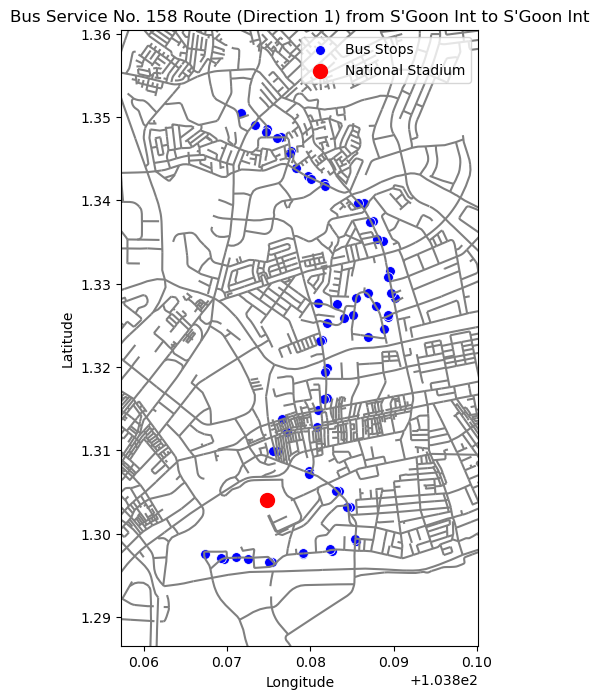

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


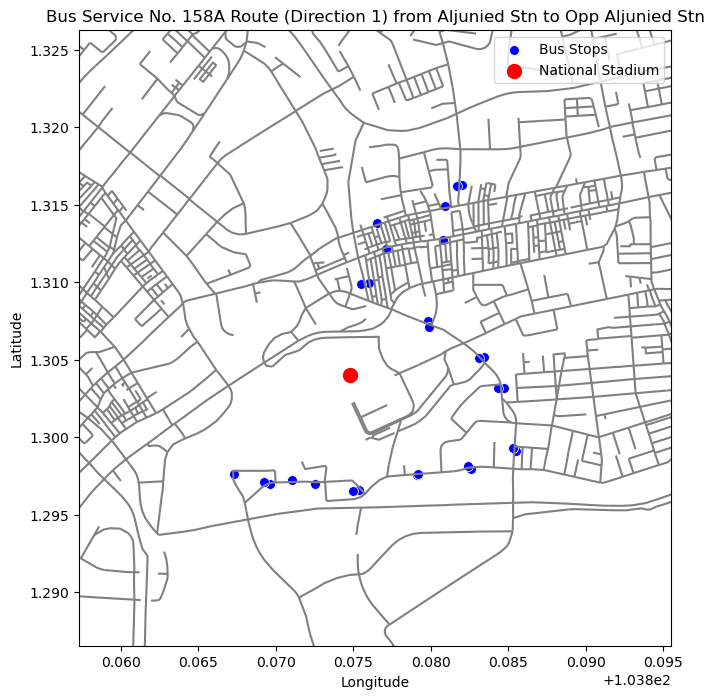

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


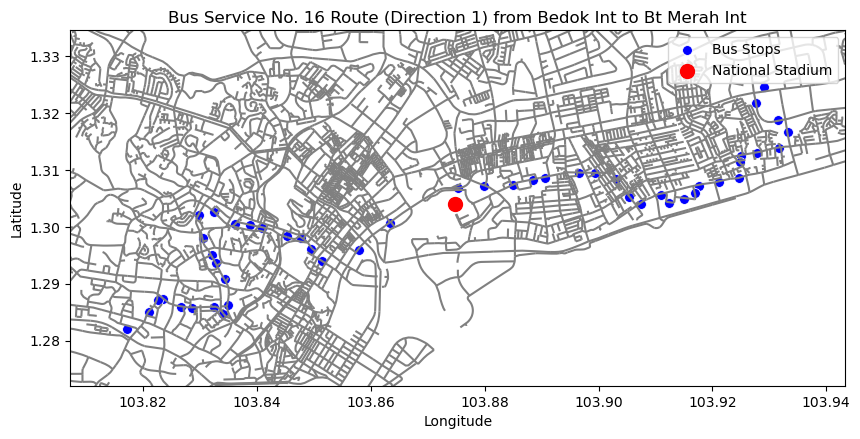

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


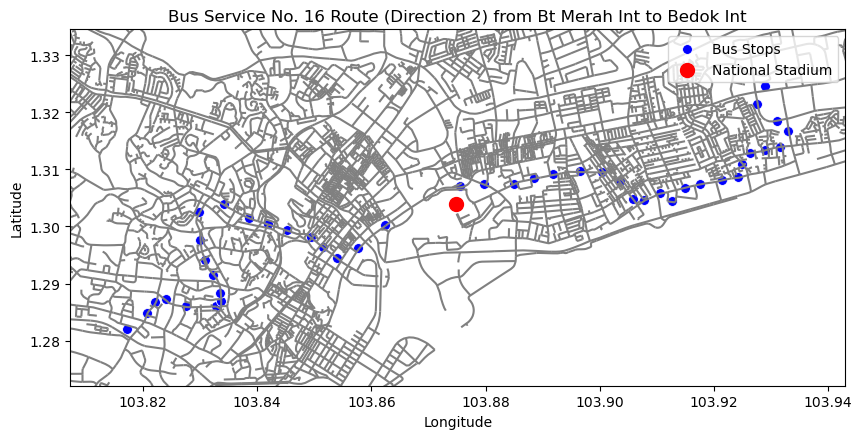

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


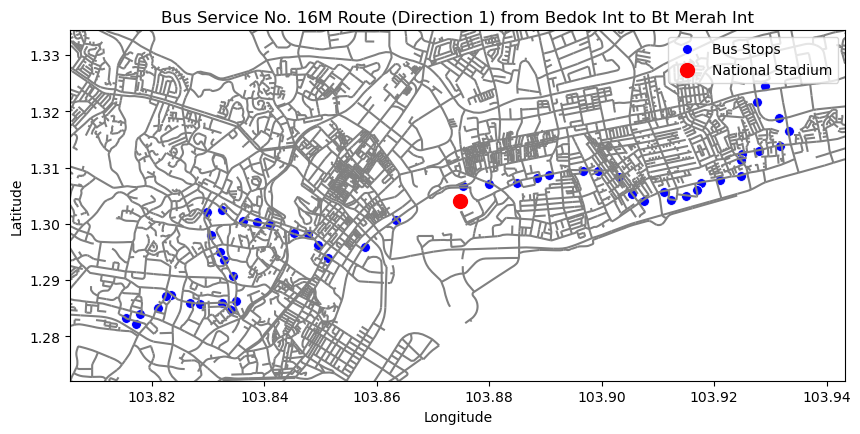

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


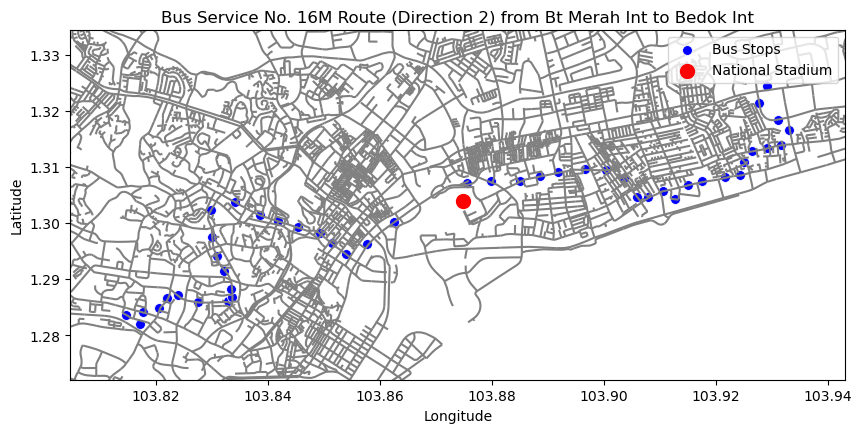

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


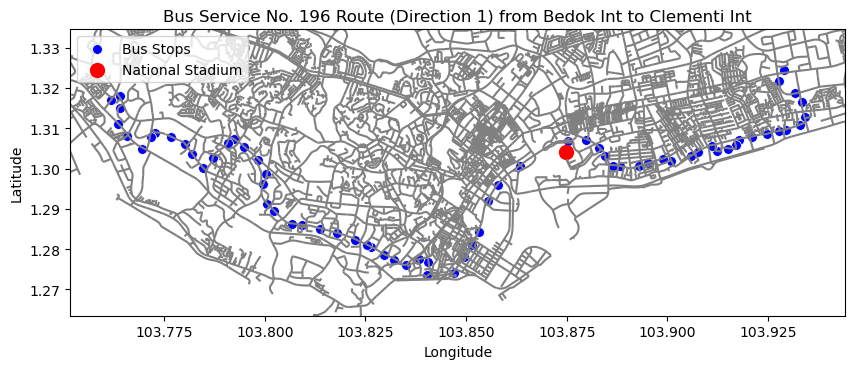

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


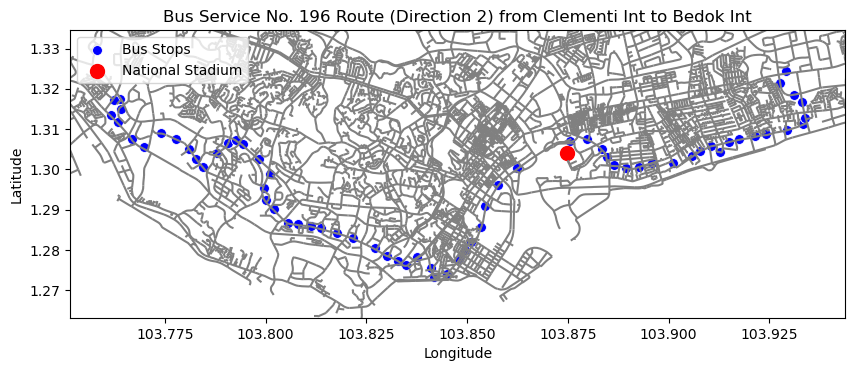

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


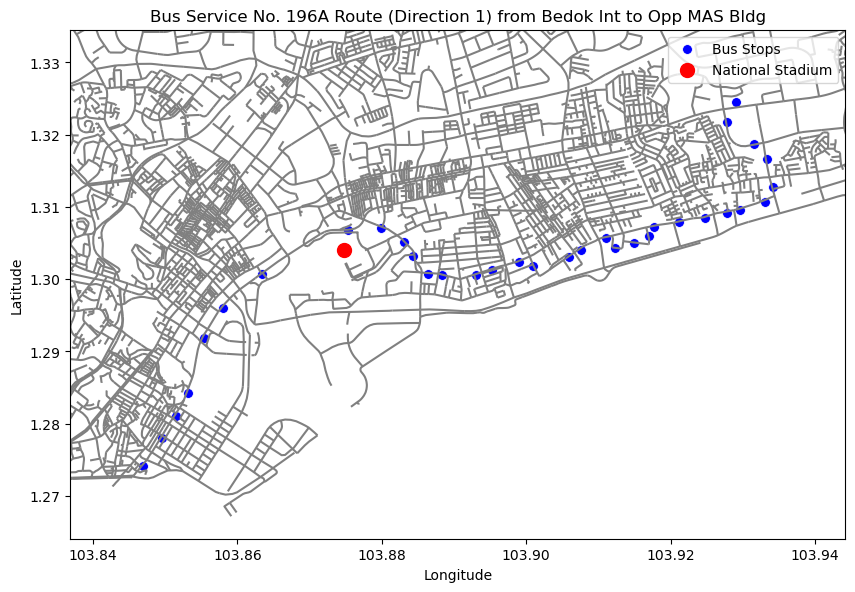

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


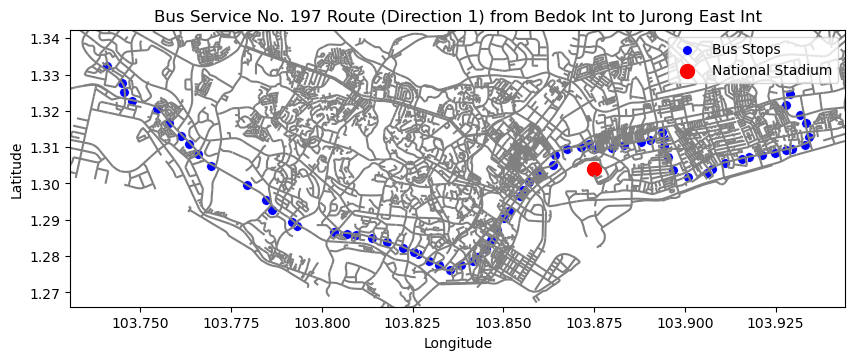

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


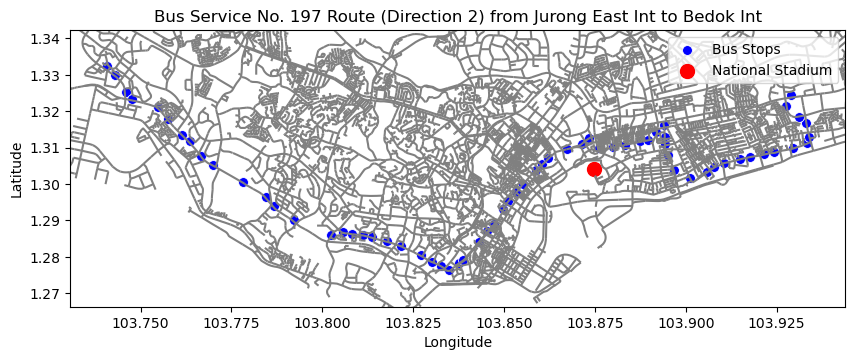

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


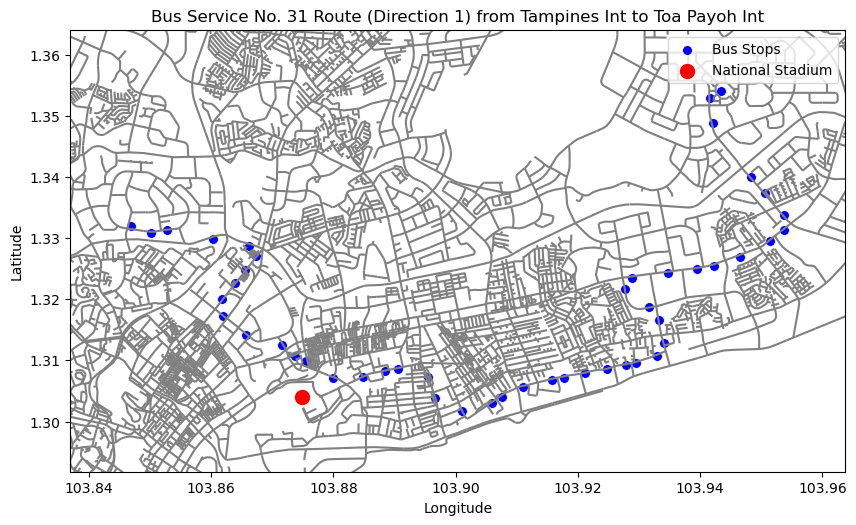

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


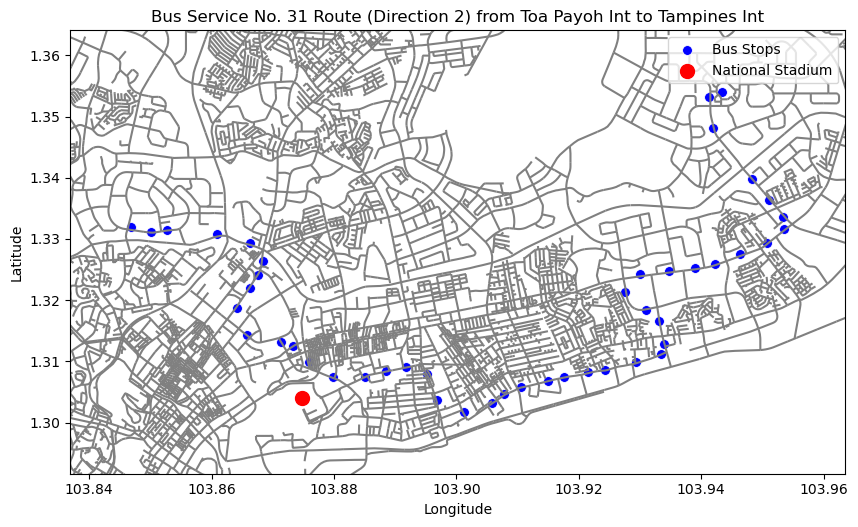

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


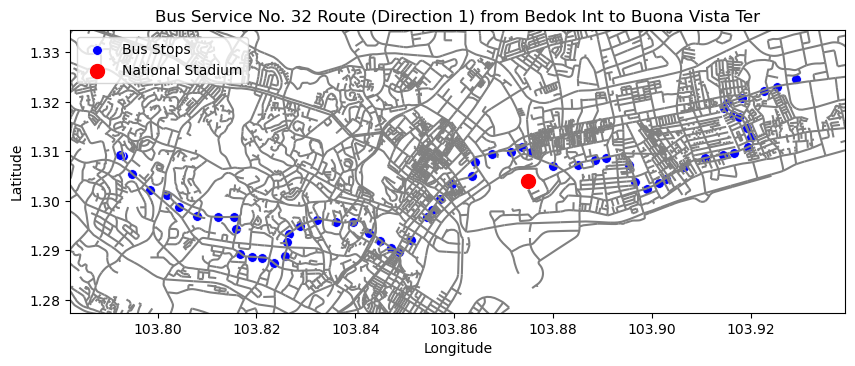

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


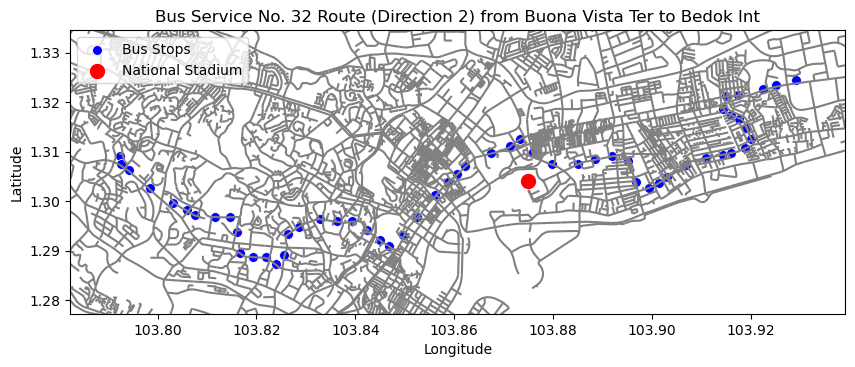

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


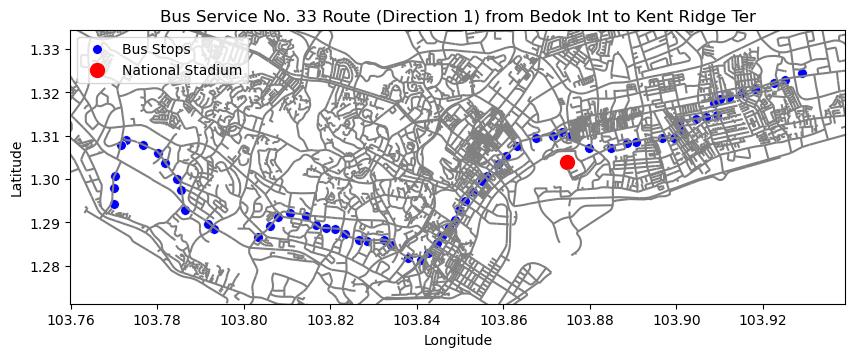

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


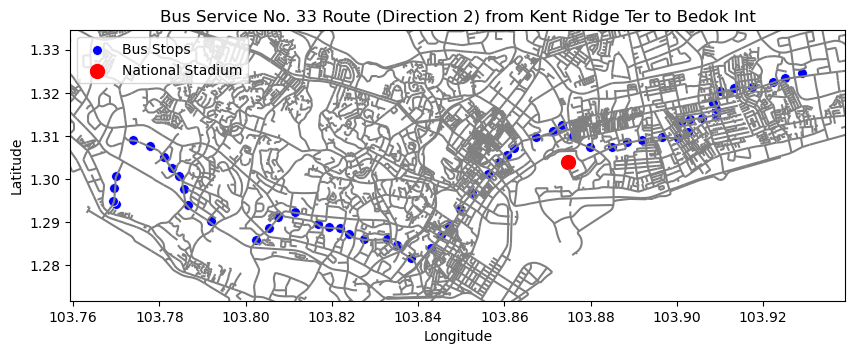

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


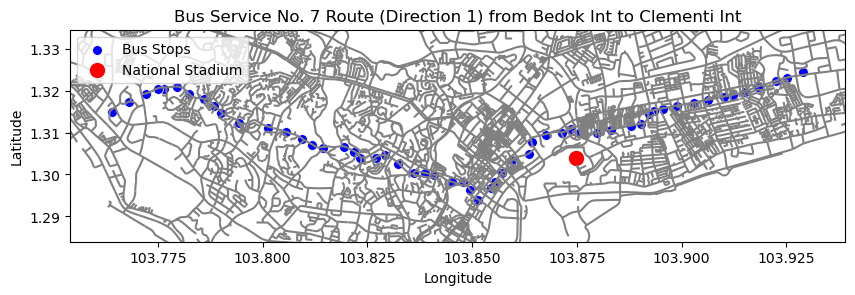

C:\Users\Wei Xuan\AppData\Local\Temp\ipykernel_27164\474864181.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  route_example.sort_values('StopSequence', inplace=True)


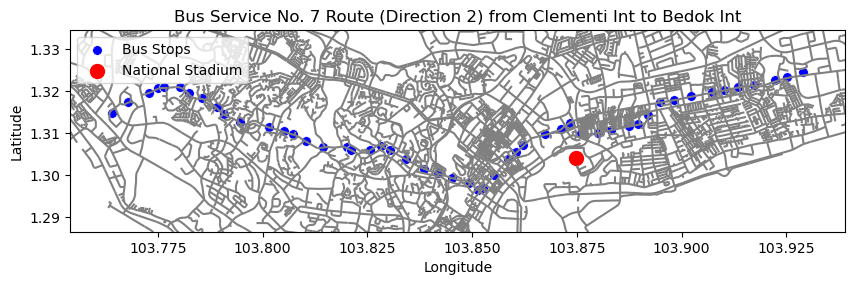

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

unique_routes = route_analysis[['ServiceNo', 'Direction']].drop_duplicates()
for _, row in unique_routes.iterrows():
    service_no = row['ServiceNo']
    route_direction = row['Direction']
    
    route_example = route_analysis[(route_analysis['ServiceNo'] == service_no) & (route_analysis['Direction'] == route_direction)]

    singapore_map = gpd.read_file('RoadSectionLine.shp')

    svy21_wkt = 'PROJCS["SVY21",GEOGCS["GCS_WGS_1984",DATUM["D_WGS_1984",SPHEROID["WGS_1984",6378137.0,298.257223563]],PRIMEM["Greenwich",0.0],UNIT["Degree",0.0174532925199433]],PROJECTION["Transverse_Mercator"],PARAMETER["False_Easting",28001.642],PARAMETER["False_Northing",38744.572],PARAMETER["Central_Meridian",103.8333333333333],PARAMETER["Scale_Factor",1.0],PARAMETER["Latitude_Of_Origin",1.366666666666667],UNIT["Meter",1.0]]'
    singapore_map.set_crs(svy21_wkt, inplace=True)
    singapore_map = singapore_map.to_crs('epsg:4326')

    # bounds for bus route
    min_lon, max_lon = route_example['Longitude'].min(), route_example['Longitude'].max()
    min_lat, max_lat = route_example['Latitude'].min(), route_example['Latitude'].max()
    buffer = 0.01  
    min_lon -= buffer
    max_lon += buffer
    min_lat -= buffer
    max_lat += buffer

    # base layer: SG map 
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    singapore_map.plot(ax=ax, color='gray')  
    ax.set_xlim(min_lon, max_lon)
    ax.set_ylim(min_lat, max_lat)

    # bus route scatter plot
    sns.scatterplot(x='Longitude', y='Latitude', data=route_example, color='blue', s=50, label='Bus Stops')

    # Stadium coordinates
    ax.scatter(stadium_coords[1], stadium_coords[0], color='red', s=100, label='National Stadium')

    # To name the route
    route_example.sort_values('StopSequence', inplace=True)
    first_stop_name = route_example.iloc[0]['Description']
    last_stop_name = route_example.iloc[-1]['Description']
    plot_title = f"Bus Service No. {service_no} Route (Direction {route_direction}) from {first_stop_name} to {last_stop_name}"
    plt.title(plot_title)

    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    ax.legend()
    plt.show()

In [102]:
services_of_interest = unique_bus_services  
frequency_analysis = bus_services[bus_services['ServiceNo'].isin(services_of_interest)]

frequency_analysis = frequency_analysis[
    ['ServiceNo', 'Operator', 'Direction', 'AM_Peak_Freq', 'AM_Offpeak_Freq', 'PM_Peak_Freq', 'PM_Offpeak_Freq']
].drop_duplicates()

frequency_analysis

,ServiceNo,Operator,Direction,AM_Peak_Freq,AM_Offpeak_Freq,PM_Peak_Freq,PM_Offpeak_Freq
5,12,GAS,1,09-09,09-14,09-10,11-13
6,12,GAS,2,10-10,08-15,08-14,10-14
66,10,SBST,1,08-09,06-16,10-15,15-17
67,10,SBST,2,10-11,11-16,08-13,13-16
88,11,SBST,1,15-17,15-19,15-19,15-25
142,14,SBST,1,10-11,10-16,14-15,14-25
143,14,SBST,2,13-14,10-15,11-16,16-17
156,14A,SBST,1,18-18,14-24,-,-
174,158,SBST,1,11-13,11-16,13-14,14-25
175,158A,SBST,1,26-26,-,-,-
